<a href="https://colab.research.google.com/github/Renyambar/PCVK26_23_Reny/blob/main/Week02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##D1. Pengenalan Python: Pengolahan Citra Dasar dan memahami channel warna pada OpenCV dan konversinya

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving ktm.jpg to ktm.jpg


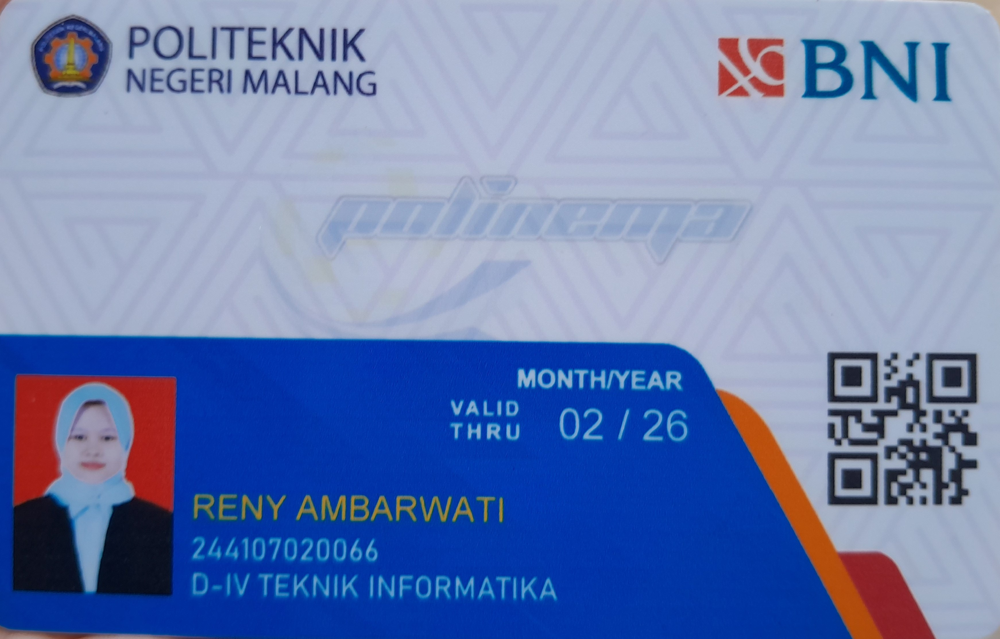

Resolusi gambar:  3483  x  2228


In [1]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

img = cv.imread('ktm.jpg')
cv2_imshow(img)

print("Resolusi gambar: " , img.shape[1], " x ", img.shape[0])

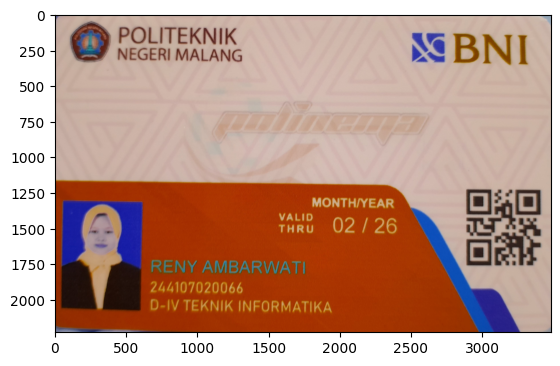

In [2]:
img = cv.imread('ktm.jpg')
plt.imshow(img)

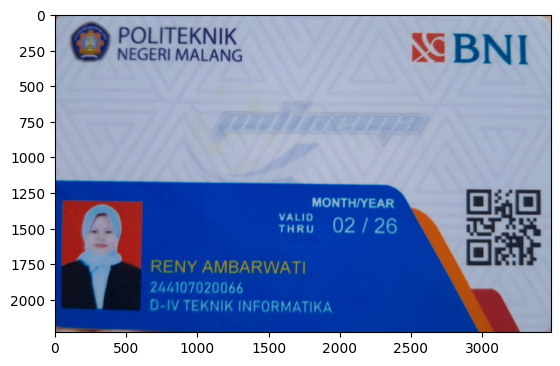

In [3]:
img = cv.imread('ktm.jpg')
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.show()

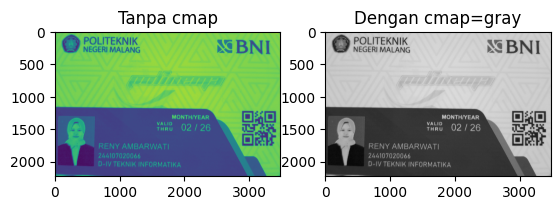

In [4]:
img_gray = cv.imread('ktm.jpg', cv.IMREAD_GRAYSCALE)
plt.subplot(1, 2, 1)
plt.imshow(img_gray)
plt.title('Tanpa cmap')

plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap='gray')
plt.title('Dengan cmap=gray')

plt.show()

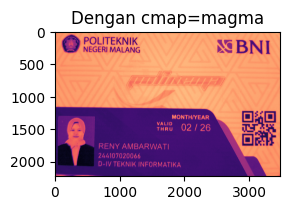

In [5]:
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap='magma')
plt.title('Dengan cmap=magma')

plt.show()

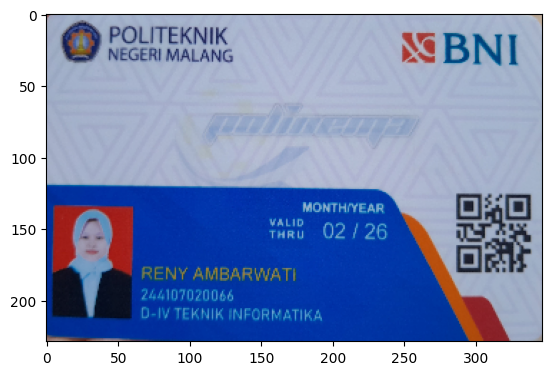

In [7]:
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_output = cv.resize(imgRGB, (347, 229))
plt.imshow(img_output)

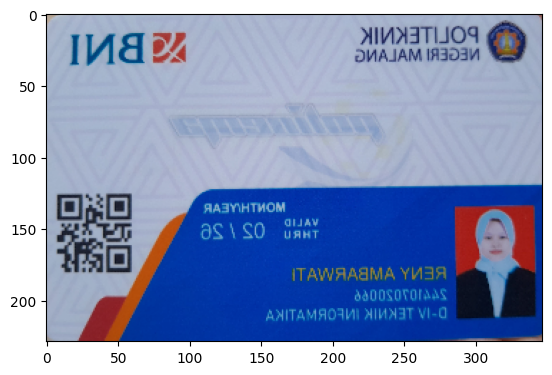

In [8]:
imgFlip = cv.flip(img_output, 1)
plt.imshow(imgFlip)

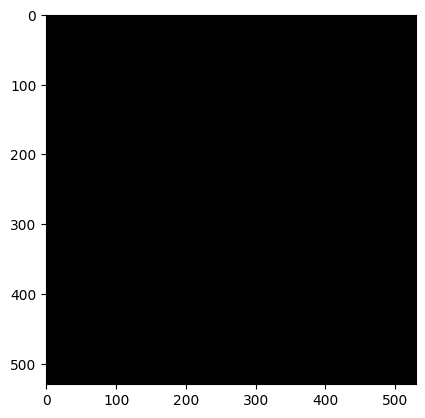

In [ ]:
black_img2 = np.zeros(shape=(530,530,3), dtype=np.int32)
plt.imshow(black_img2)

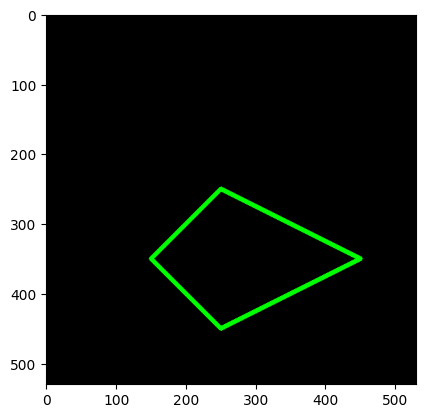

In [ ]:
vertices = np.array([[150,350], [250,250], [450,350], [250,450]],dtype=np.int32)
vertices
pts = vertices.reshape((-1,1,2)) # nilai 2 untuk menunjukkan bahwa tiap titik dibuat 3 channel yg mewakili R, G, dan B
pts
cv.polylines(black_img2, [pts],isClosed=True,color=(0,255,0),thickness=5)
plt.imshow(black_img2)

# PERTANYAAN PRAKTIKUM

## 1. Mengapa `cv2_imshow()` dan `plt.imshow()` tanpa konversi berbeda?
Jawaban:  karena OpenCV membaca dan menyimpan citra berwarna dalam urutan BGR (Blue, Green, Red), sedangkan Matplotlib menganggap citra berwarna memiliki urutan RGB (Red, Green, Blue).

Akibatnya, apabila citra hasil cv2.imread() langsung diberikan kepada plt.imshow() tanpa konversi, kanal biru dan merah akan tertukar sehingga warna citra yang ditampilkan menjadi berbeda.


In [ ]:
img = cv.imread('ktm.jpg')

# Konversi BGR ke RGB
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Pilih piksel yang sama
y = img.shape[0] // 2
x = img.shape[1] // 2

# Nilai piksel dari citra BGR
p_bgr = img[y, x]

# Nilai piksel dari citra RGB
p_rgb = img_rgb[y, x]

print("Koordinat piksel (x, y):", (x, y))
print("Nilai BGR dari cv2.imread():", p_bgr)
print("Nilai RGB setelah cvtColor():", p_rgb)
print("BGR dibalik urutannya:", p_bgr[::-1])

Koordinat piksel (x, y): (1808, 1207)
Nilai BGR dari cv2.imread(): [208 185 177]
Nilai RGB setelah cvtColor(): [177 185 208]
BGR dibalik urutannya: [177 185 208]


hasil tampilan berbeda bukan karena nilai piksel berubah saat `plt.imshow()` dipanggil, tetapi karena Matplotlib dan OpenCV memakai konvensi urutan kanal yang berbeda.


## 2. Bandingkan kanvas `int16` dan `int32`
Keduanya dibuat dengan ukuran sama. `min()` dan `max()` bernilai sama karena seluruh elemen diinisialisasi nol, tetapi `nbytes` berbeda karena `int32` menggunakan 4 byte per elemen sedangkan `int16` menggunakan 2 byte.


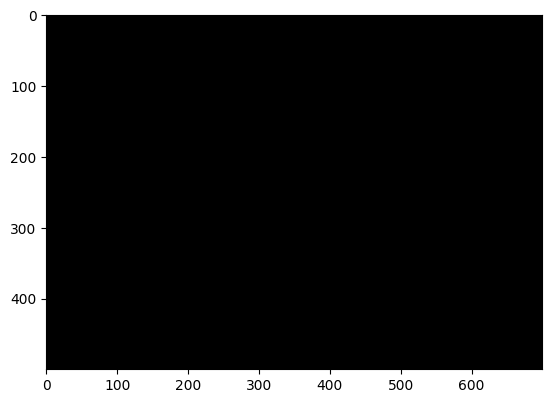

In [ ]:
H, W = 500, 700

canvas_int16 = np.zeros((H, W, 3), dtype=np.int16)
canvas_int32 = np.zeros((H, W, 3), dtype=np.int32)

plt.imshow(canvas_int16)



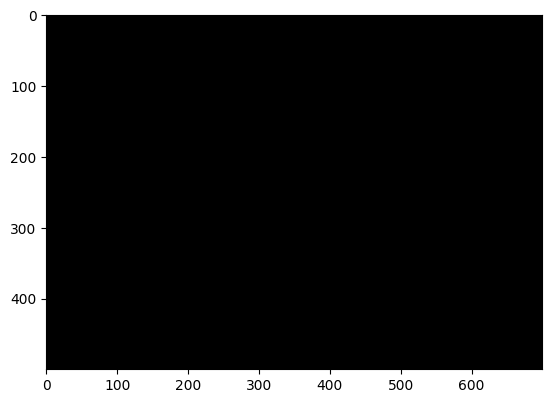

In [ ]:
plt.imshow(canvas_int32)

**Jawaban:** tampilan awal kedua kanvas sama-sama hitam karena seluruh piksel bernilai 0. Ukuran memori berbeda karena `int16` memakai 2 byte per elemen, sedangkan `int32` memakai 4 byte per elemen. Untuk jumlah elemen yang sama, `int32` membutuhkan 2× memori `int16`.


## 3. Kegunaan `cv2_imshow()` dan alasan `cv2.imshow()` tidak digunakan di Colab
**Jawaban:**`cv2.imshow()` bawaan OpenCV berfungsi untuk membuat jendela GUI pada sistem operasi desktop, sedangkan lingkungan Google Colab tidak menyediakan jendela GUI tersebut seperti komputer lokal. Karena itu `cv2_imshow()` tidak digunakan di Colab.

## 4. Perbandingan `skimage.io.imread()` dan `cv2.cvtColor(..., BGR2RGB)`
Keduanya akan benar jika digunakan sesuai sumbernya:
- `skimage.io.imread()` membaca citra berwarna sebagai **RGB**.
- `cv2.imread()` membaca sebagai **BGR**, sehingga perlu `cv2.cvtColor(..., COLOR_BGR2RGB)` sebelum dibandingkan sebagai RGB.

Pembuktian menggunakan nilai piksel.


skimage shape : (2228, 3483, 3)
skimage dtype : uint8
OpenCV RGB shape : (2228, 3483, 3)
OpenCV RGB dtype : uint8

Koordinat piksel (x, y): (1741, 1114)
Piksel skimage RGB     : [171 178 204]
Piksel OpenCV RGB      : [171 178 204]
Nilai piksel sama?     : True


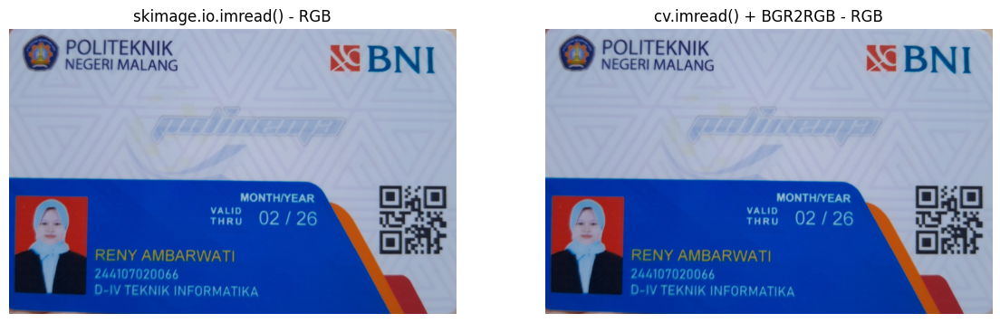

In [11]:
img_skimage = io.imread('ktm.jpg')

# Baca file dengan OpenCV
img_bgr = cv.imread('ktm.jpg')

# Konversi BGR menjadi RGB
img_cv_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

# Tampilkan informasi citra
print("skimage shape :", img_skimage.shape)
print("skimage dtype :", img_skimage.dtype)

print("OpenCV RGB shape :", img_cv_rgb.shape)
print("OpenCV RGB dtype :", img_cv_rgb.dtype)

# Ambil piksel pada bagian tengah gambar
y = img_skimage.shape[0] // 2
x = img_skimage.shape[1] // 2

print("\nKoordinat piksel (x, y):", (x, y))
print("Piksel skimage RGB     :", img_skimage[y, x])
print("Piksel OpenCV RGB      :", img_cv_rgb[y, x])

# Bandingkan nilai piksel
print("Nilai piksel sama?     :",
      np.array_equal(img_skimage[y, x], img_cv_rgb[y, x]))

# Tampilkan kedua citra
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

ax[0].imshow(img_skimage)
ax[0].set_title('skimage.io.imread() - RGB')
ax[0].axis('off')

ax[1].imshow(img_cv_rgb)
ax[1].set_title('cv.imread() + BGR2RGB - RGB')
ax[1].axis('off')

plt.show()

**Jawaban:** `skimage.io.imread()` menampilkan warna sebenarnya karena pembacaan citra berwarna menggunakan urutan RGB. Hasil `cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)` juga menampilkan warna sebenarnya karena urutan BGR dari OpenCV telah diubah menjadi RGB. Jika `cv2.cvtColor(..., BGR2RGB)` diterapkan pada citra yang sudah RGB dari skimage, kanal justru akan tertukar.


## 5. Jelaskan perbedaan antara mengubah ukuran citradan mengubah ukuran tampilan.
**Jawaban:** memperbesar `figsize` hanya memperbesar kanvas tampilan Matplotlib. Jumlah piksel citra tidak berubah, sehingga `img.shape` tetap sama. Untuk benar-benar mengubah jumlah piksel digunakan `cv2.resize()`.


# TUGAS PRAKTIKUM — PENERAPAN

Berdasarkan praktikum bagian 1 dan 2 kerjakan beberapa tugas berikut :

 1. Tampilkan citra hanya pada kombinasi kanal Merah-Biru dan kanal Hijau-Biru
saja, dengan kanal yang tidak dipakai dinolkan. Susun keduanya berdampingan dalam satu figure yang diberi judul.
 2. Tampilkan citra dalam tiga bentuk pencerminan: vertikal, horizontal, dan
keduanya, dalam satu figure berisi tiga subplot yang masing-masing diberi
label.
 3. Gambarkan sebuah rectangle dan sebuah circle pada bagian wajah /
badan dari foto aktivitas Anda sendiri (bukan pasfoto), lalu tambahkan
teks berisi nama Anda dengan pilihan font, ukuran, dan warna yang Anda
tentukan sendiri.

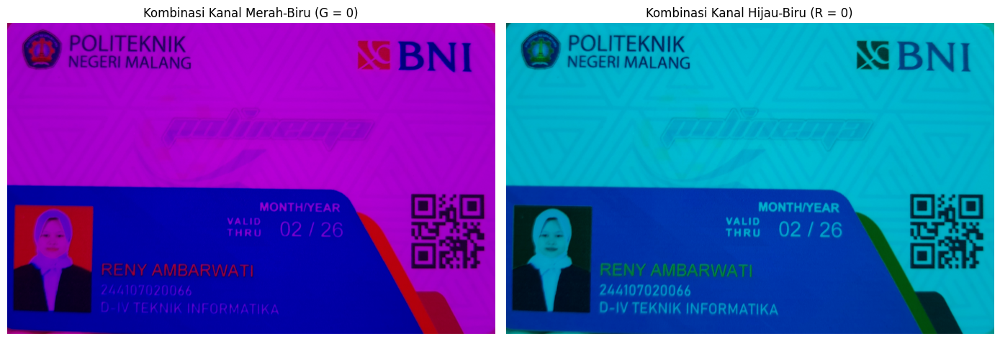

In [12]:
# BGR index: B=0, G=1, R=2
red_blue = img_bgr.copy()
red_blue[:, :, 1] = 0

green_blue = img_bgr.copy()
green_blue[:, :, 2] = 0

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(cv.cvtColor(red_blue, cv.COLOR_BGR2RGB))
axes[0].set_title('Kombinasi Kanal Merah-Biru (G = 0)')
axes[0].axis('off')

axes[1].imshow(cv.cvtColor(green_blue, cv.COLOR_BGR2RGB))
axes[1].set_title('Kombinasi Kanal Hijau-Biru (R = 0)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

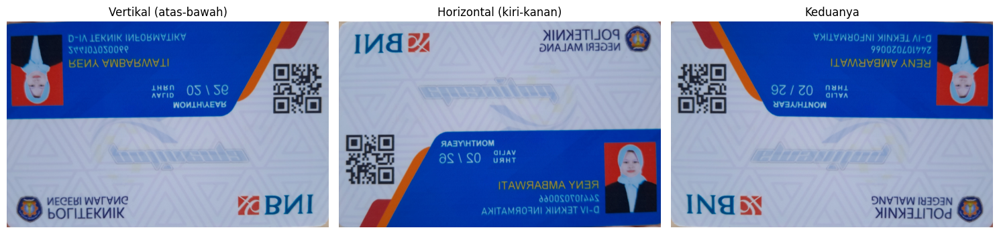

In [13]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

hasil_flip = [
    cv.flip(img_bgr, 0),
    cv.flip(img_bgr, 1),
    cv.flip(img_bgr, -1)
]
judul_flip = [
    'Vertikal (atas-bawah)',
    'Horizontal (kiri-kanan)',
    'Keduanya'
]

for ax, im, title in zip(axes, hasil_flip, judul_flip):
    ax.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


Resolusi gambar:  3072  x  4096


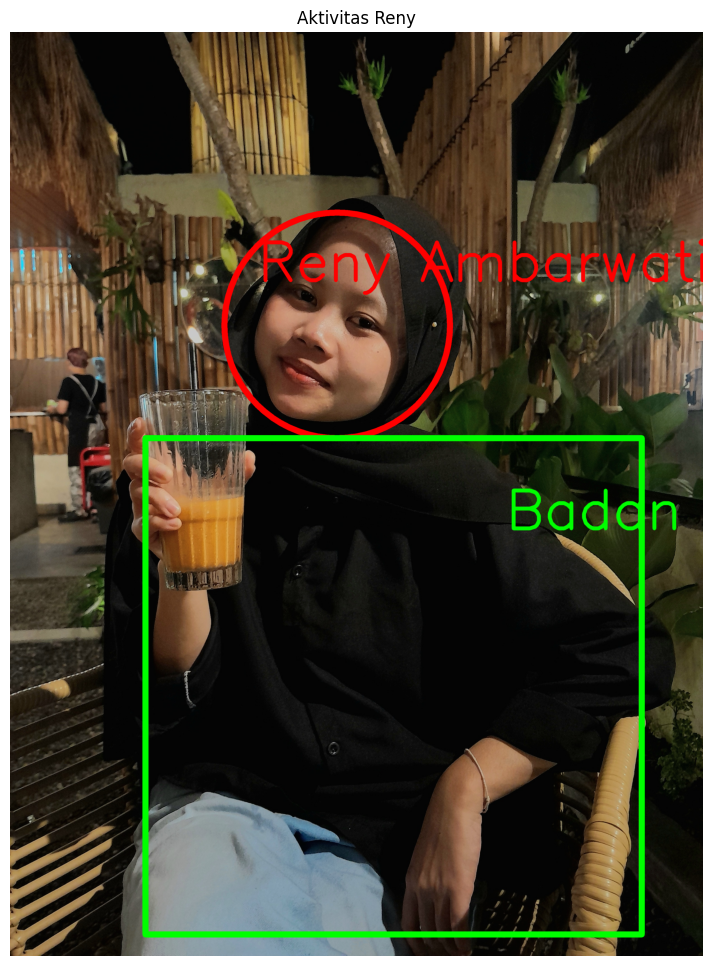

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK 2026/ambar.jpg')

print("Resolusi gambar: " , img.shape[1], " x ", img.shape[0])
img_draw = cv.cvtColor(img, cv.COLOR_BGR2RGB)
# 1. Circle di Wajah (Warna Merah)
cv.circle(img_draw, center=(1450, 1300), radius=500, color=(255, 0, 0), thickness=25)
cv.putText(img_draw, text='Reny Ambarwati', org=(1100, 1100), fontFace=cv.FONT_HERSHEY_SIMPLEX, fontScale=8, color=(255, 0, 0), thickness=15, lineType=cv.LINE_AA)

# 2. Rectangle di Badan (Warna Hijau)
cv.rectangle(img_draw, pt1=(600, 1800), pt2=(2800, 4000), color=(0, 255, 0), thickness=25)
cv.putText(img_draw, text='Badan', org=(2200, 2200), fontFace=cv.FONT_HERSHEY_SIMPLEX, fontScale=8, color=(0, 255, 0), thickness=15, lineType=cv.LINE_AA)

plt.figure(figsize=(10, 12))
plt.imshow(img_draw)
plt.title('Aktivitas Reny')
plt.axis('off')
plt.show()

# TUGAS PRAKTIKUM — ANALISA

## Pertanyaan
**Rumuskan satu pertanyaan tentang citra digital yang dapat Anda jawab
menggunakan kode dari modul ini. Contoh pertanyaan: berapa persen
piksel pada foto KTM Anda yang lebih gelap dari nilai 100? apakah
mengecilkan lalu membesarkan citra mengubah rata-rata intensitasnya?
Tuliskan pertanyaan Anda, rancangan program, data hasilnya, dan
kesimpulan Anda.**

### Rancangan
1. Ubah KTM menjadi grayscale.
2. Hitung rata-rata intensitas awal.
3. Kecilkan menjadi setengah ukuran.
4. Besarkan kembali ke ukuran semula.
5. Hitung rata-rata intensitas hasil.
6. Bandingkan selisihnya.


Ukuran asli      : (2228, 3483)
Ukuran diperkecil: (1114, 1741)
Ukuran dibesarkan: (2228, 3483)
Rata-rata awal   : 126.95095129923182
Rata-rata akhir  : 126.88975884921426
Selisih          : 0.061192450017557576


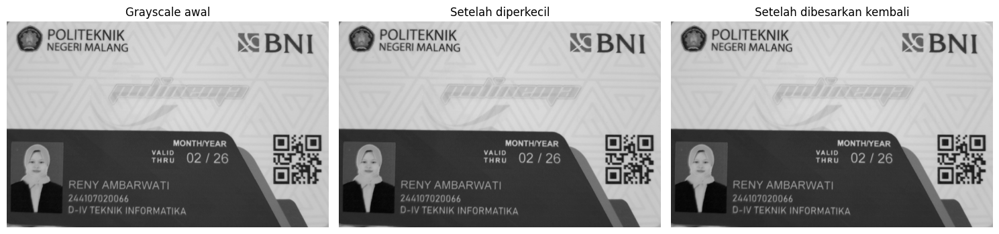

In [14]:

# Mengubah citra menjadi grayscale
gray= cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)

# Ukuran asli
tinggi, lebar = gray.shape

# Menghitung rata-rata intensitas awal
rata_awal = np.mean(gray)

# Mengecilkan citra menjadi setengah ukuran
gray_kecil = cv.resize(
    gray,
    (lebar // 2, tinggi // 2),
    interpolation=cv.INTER_AREA
)

# Membesarkan kembali ke ukuran semula
gray_besar = cv.resize(
    gray_kecil,
    (lebar, tinggi),
    interpolation=cv.INTER_LINEAR
)

# Menghitung rata-rata intensitas setelah resize
rata_akhir = np.mean(gray_besar)

# Menghitung selisih
selisih = rata_akhir - rata_awal

# Menampilkan hasil
print("Ukuran asli      :", gray.shape)
print("Ukuran diperkecil:", gray_kecil.shape)
print("Ukuran dibesarkan:", gray_besar.shape)

print("Rata-rata awal   :", rata_awal)
print("Rata-rata akhir  :", rata_akhir)
print("Selisih          :", abs(selisih))

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(gray, cmap='gray')
axes[0].set_title('Grayscale awal')
axes[1].imshow(gray_kecil, cmap='gray')
axes[1].set_title('Setelah diperkecil')
axes[2].imshow(gray_besar, cmap='gray')
axes[2].set_title('Setelah dibesarkan kembali')
for ax in axes:
    ax.axis('off')
plt.tight_layout()
plt.show()


### Kesimpulan Analisa
Tuliskan kesimpulan berdasarkan angka yang keluar dari program, bukan angka contoh. Jika `selisih absolut` tidak sama dengan nol, berarti proses resize + interpolasi telah mengubah nilai piksel secara keseluruhan sehingga rata-rata intensitas juga berubah. Jika pada suatu gambar selisihnya sangat kecil, perubahan rata-rata dapat dikatakan kecil, tetapi proses resize tetap melakukan estimasi nilai piksel.

# TUGAS PRAKTIKUM — APLIKASI

## Studi Kasus 1
Panitia sebuah kegiatan perlu membubuhkan label identitas pada
ratusan foto dokumentasi. Foto berasal dari beberapa kamera dan ponsel,
sehingga ukurannya bermacam-macam. Label harus terlihat seimbang pada
semua foto tanpa disetel satu per satu. Fungsi yang sama dikenakan pada dua
citra berbeda ukuran. Tinggi bar dan ukuran huruf ikut menyesuaikan, sehingga
proporsinya tetap sama. Silakan melakukan akuisisi data sendiri, setiap anak
harus menggunakan image yang berbeda-beda

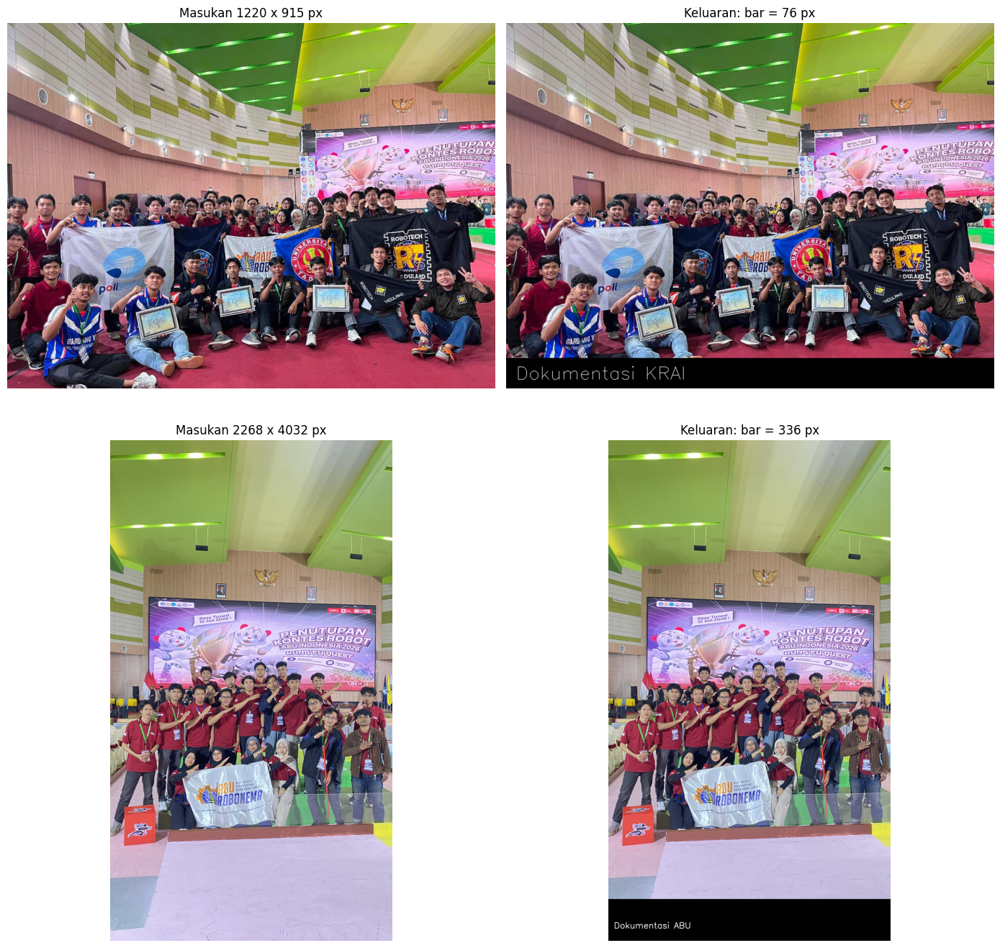

In [ ]:
def tambah_label_adaptif(img, label):
    out = img.copy()

    # Ukuran gambar
    h, w = out.shape[:2]

    # Tinggi bar = 1/12 tinggi gambar
    bar_h = max(1, int(h / 12))

    # Ukuran font adaptif
    font_scale = max(1.5, h / 1800)
    thickness = max(1, int(h / 1000))

    y_start = h - bar_h

    # Membuat bar hitam
    cv.rectangle(
        out,
        (0, y_start),
        (w, h),
        (0, 0, 0),
        cv.FILLED
    )

    # Posisi teks
    text_x = int(0.02 * w)
    text_y = y_start + int(0.70 * bar_h)

    # Menambahkan nama
    cv.putText(
        out,
        label,
        (text_x, text_y),
        cv.FONT_HERSHEY_SIMPLEX,
        font_scale,
        (255, 255, 255),
        thickness,
        cv.LINE_AA
    )

    return out


img_a = cv.imread(
    '/content/drive/MyDrive/PCVK 2026/krai.jpg'
)

img_b = cv.imread(
    '/content/drive/MyDrive/PCVK 2026/abu'
)


h_a, w_a = img_a.shape[:2]
h_b, w_b = img_b.shape[:2]

bar_a = int(h_a / 12)
bar_b = int(h_b / 12)

hasil_a = tambah_label_adaptif(
    img_a,
    "Dokumentasi KRAI"
)

hasil_b = tambah_label_adaptif(
    img_b,
    "Dokumentasi ABU"
)



fig, axes = plt.subplots(
    2, 2,
    figsize=(14, 14)
)

axes[0, 0].imshow(
    cv.cvtColor(img_a, cv.COLOR_BGR2RGB)
)

axes[0, 0].set_title(
    f"Masukan {w_a} x {h_a} px"
)

axes[0, 0].axis('off')




axes[0, 1].imshow(
    cv.cvtColor(hasil_a, cv.COLOR_BGR2RGB)
)

axes[0, 1].set_title(
    f"Keluaran: bar = {bar_a} px"
)

axes[0, 1].axis('off')


#INPUT
axes[1, 0].imshow(
    cv.cvtColor(img_b, cv.COLOR_BGR2RGB)
)

axes[1, 0].set_title(
    f"Masukan {w_b} x {h_b} px"
)

axes[1, 0].axis('off')

#OUTPUT
axes[1, 1].imshow(
    cv.cvtColor(hasil_b, cv.COLOR_BGR2RGB)
)

axes[1, 1].set_title(
    f"Keluaran: bar = {bar_b} px"
)

axes[1, 1].axis('off')


plt.tight_layout()
plt.show()

## Studi Kasus 2
Marketplace seperti Tokopedia dan Shopee menampilkan foto
produk dalam bingkai persegi 1:1. Foto penjual yang berukuran potrait atau
lanskap akan terpotong atau terlihat tidak proporsional bila diunggah begitu saja.
Bangun program yang mengubah foto berukuran apa pun menjadi thumbnail
persegi tanpa mengubah rasio aslinya, dengan sisa ruang diisi kanvas berwarna.
Dalam hal ini, rasio asli tetap terjaga, citra terpasang tepat di tengah kanvas,
tambahkan logo nama toko berukuran proporsional pada gambar.



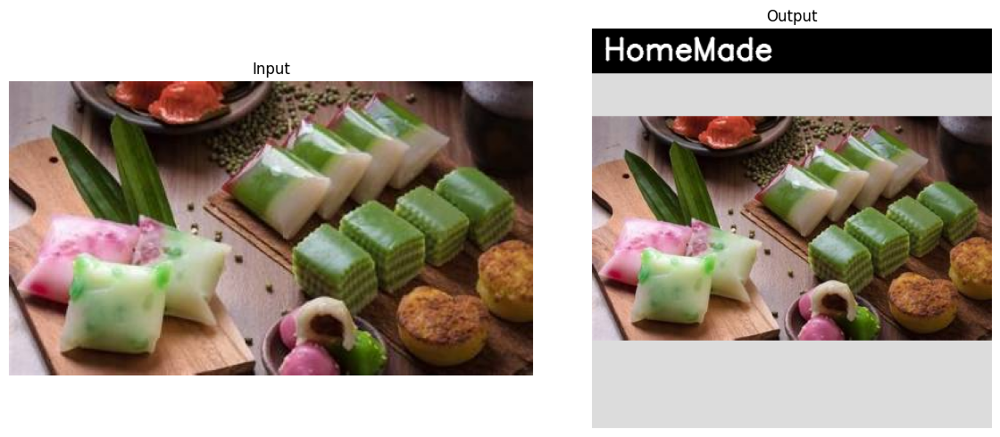

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('kue.jpeg')

def thumbnail_square(img, nama_toko=""):

    # Ukuran gambar asli
    h, w = img.shape[:2]

    side = max(h, w)

    # Membuat kanvas abu-abu
    canvas = np.full(
        (side, side, 3),
        220,
        dtype=np.uint8
    )

    # Menentukan posisi gambar di tengah
    x = (side - w) // 2
    y = (side - h) // 2

    canvas[y:y+h, x:x+w] = img

    # Tinggi bar atas
    bar_h = int(0.11 * side)

    # Membuat bar hitam
    cv.rectangle(
        canvas,
        (0, 0),
        (side, bar_h),
        (0, 0, 0),
        cv.FILLED
    )

    # Ukuran tulisan menyesuaikan ukuran kanvas
    font_scale = max(0.4, 0.0025 * side)
    thickness = max(1, int(0.006 * side))

    # Posisi tulisan
    text_x = int(0.03 * side)
    text_y = int(0.70 * bar_h)

    # Menambahkan nama toko
    cv.putText(
        canvas,
        nama_toko,
        (text_x, text_y),
        cv.FONT_HERSHEY_SIMPLEX,
        font_scale,
        (255, 255, 255),
        thickness,
        cv.LINE_AA
    )

    return canvas


# Membuat output
output = thumbnail_square(img, "HomeMade")


# Menampilkan input dan output
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Input")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(output, cv.COLOR_BGR2RGB))
plt.title("Output")
plt.axis("off")

plt.tight_layout()
plt.show()